# Multistart method augmented with skipping moves

We present here the code to augment the multistart method by updating the initial points (sampled uniformly at random in the given domain) by skipping moves. We report the results for the so-called Eggholder function.

In [6]:
import numpy as np 
import math
from scipy.stats import gengamma
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy import optimize
import time
import pandas as pd

def eggholder(x):
    return -(x[1]+ 47.)*math.sin(math.sqrt(abs(x[1] + x[0]/2. + 47.))) - x[0]*math.sin(math.sqrt(abs(x[0] - x[1] - 47.)))

def noncvxconstraints(point):
    [x,y] = point
    return ((-7000 + 0.001 * x**3 + 240 * y + 2.4 * y**2 + 0.008 * y**3 >= 0) and (8*10**7 + 1000 * y**2 - x**3 - 600000 * y >= 0) ) or ( (500000 + 1000 * x + x**2 + 5000 * y + 5 * y**2 <= 0) and (190000 + 500 * x + 400 * y + x * y <= 0)) or (329000 + x**2 + 3000 * y + 6 * y**2 + 2 * x * (300 + y) <= 0)

def densityratio(new, old, function, temp):
    global nfeval
    nfeval += 2
    delta = function(new)-function(old)
    if delta < 0.:
        return 1.
    elif temp > 0.:
        return math.exp(-delta/temp)
    else:
        return 0.

def boundaryconstraintQ(x, boxsize):
    # checks only boundary constraints
    return bool(np.all(x <= boxsize)) and bool(np.all(x >= -boxsize))

def monotonicityconstraintQ(x, function, threshold):
    # checks both boundary and threshold value constraints
    global nfeval
    nfeval += 1
    return function(x) < threshold

def bothconstraintsQ(x, boxsize, function, threshold):
    # checks for both boundary and threshold value constraints
    return boundaryconstraintQ(x, boxsize) and monotonicityconstraintQ(x, function, threshold)

def bothconstraintsQindependent(x, boxsize, function, threshold):
    # checks for both boundary and threshold value constraints independently
    return boundaryconstraintQ(x, boxsize), monotonicityconstraintQ(x, function, threshold)

def checkcoordinates(x, boxsize):
    newx = x
    for i in range(x.shape[0]):
        if x[i] > boxsize:
            newx[i] = x[i] - 2*boxsize
        elif x[i] < -boxsize:
            newx[i] = x[i] + 2*boxsize
    return newx
    
def smartskippingmove(x, boxsize, function, sigma, maxjumps=50, periodicboundary=True):
    # skipping move function with threshold value and function evaluations counter
    global emptymoves
    global nfeval
    global emptymoves
    
    d = x.shape[0]
    threshold = function(x)
    nfeval += 1
    phi = np.random.normal(loc=0.0, scale=sigma, size=d)
    phi = phi/np.linalg.norm(phi)
    beta = math.sqrt(2 * sigma)
    r = gengamma.rvs(a = d/2., c = 2., loc = 0., scale = beta, size = maxjumps)
    xnew = x + phi*r[0]
    j = 1
    if periodicboundary:
        xnew = checkcoordinates(xnew, boxsize)
        monotonicityflag = monotonicityconstraintQ(xnew, function, threshold)
        nfeval += 1
        while (j < maxjumps and not(monotonicityflag)):
            xnew += phi*r[j]
            xnew = checkcoordinates(xnew, boxsize)
            j += 1
            monotonicityflag = monotonicityconstraintQ(xnew, function, threshold)

        if monotonicityflag:
            return True, xnew
        else:
            emptymoves += 1
            return False, x
    else:
        boundaryflag, monotonicityflag = bothconstraintsQindependent(xnew, boxsize, function, threshold)
        nfeval += 1
        while (j < maxjumps and boundaryflag and not(monotonicityflag)):
            xnew += phi*r[j]
            j += 1
            boundaryflag, monotonicityflag = bothconstraintsQindependent(xnew, boxsize, function, threshold)

        if boundaryflag and monotonicityflag:
            return True, xnew
        else:
            emptymoves += 1
            return False, x

def smartskippingtrajectory(x, boxsize, function, sigma, temp, maxsteps, maxjumps, maxlocalnonexits, periodicboundary=True):
    # smart skipping trajectory with threshold value (and function evaluations counter)
    global nfeval
    
    nfeval = 0
    d = 2
    step = 0
    accepted = 0
    rejected = 0
    truesteps = 0
    localnonexits = 0
    trajectory = np.zeros([maxsteps+1,d])
    trajectory[step] = np.array(x)
    
    while step < maxsteps and localnonexits <= maxlocalnonexits:
        truesteps += 1
        exitflag, proposal = smartskippingmove(trajectory[step], boxsize, function, sigma, maxjumps, periodicboundary)
        if exitflag:
            if np.random.uniform() <= densityratio(proposal, trajectory[step], function, temp):
                trajectory[step+1] = proposal
                localnonexits = 0
                step += 1
                accepted += 1
            else:
                rejected +=1
        else:
            localnonexits += 1
    return nfeval, trajectory[0:step+1][-1]

def classicmove(x, boxsize, sigma, periodicboundary=True):
    global emptymoves
    
    d = x.shape[0]
    phi = np.random.normal(loc=0.0, scale=sigma, size=d)
    phi = phi/np.linalg.norm(phi)
    beta = math.sqrt(2 * sigma)
    r = gengamma.rvs(a = d/2., c = 2., loc = 0., scale = beta, size = 1)
    xnew = x + phi*r[0]

    if boundaryconstraintQ(xnew, boxsize):
        return xnew
    elif periodicboundary:
        xnew = checkcoordinates(xnew, boxsize)
        return xnew
    else:
        emptymoves += 1
        return x

def classictrajectory(x, boxsize, function, sigma, temp, maxsteps, periodicboundary=True):
    # skipping trajectory with function evaluations counter but without threshold value
    global nfeval
    nfeval=0
    
    d = x.shape[0]
    step = 0
    accepted = 0
    rejected = 0
    truesteps = 0
    trajectory = np.zeros([maxsteps+1,d])
    trajectory[step] = np.array(x)
    
    while step < maxsteps:
        truesteps += 1
        proposal = classicmove(trajectory[step], boxsize, sigma, periodicboundary)
        if np.random.uniform() <= densityratio(proposal, trajectory[step], function, temp):
            trajectory[step+1] = proposal
            step += 1
            accepted += 1
        else:
            rejected +=1

    return nfeval, trajectory[0:step+1][-1]

def basinQ(x):
    if (x[1]>350 and 15*x[1]-13*x[0]+150<=1):
        return True
    else:
        return False
    
def multistart_comparison(function, n_samples = 50, maxsteps = 100, temp = 1.0, sigma = 2.0, maxjumps = 200, maxlocalnonexits = 50, periodicboundary = True, boxsize = 512, optmethod = 'L-BFGS-B', seed = 1, plotflag = True):
    
    global emptymoves
    emptymoves = 0
    
    bounds = [(-boxsize, -boxsize), (boxsize, boxsize)]
    bnds = optimize.Bounds((-boxsize, -boxsize), (boxsize, boxsize))
    trueoptimum = np.array([512, 404.2319])
    truevalue = function(trueoptimum)
    
    nfeval_nomoves = np.zeros(n_samples, dtype=np.int64)
    nfeval_skipping = np.zeros(n_samples, dtype=np.int64)
    nfeval_skippingzt = np.zeros(n_samples, dtype=np.int64)
    nfeval_classic = np.zeros(n_samples, dtype=np.int64)
    dist = np.zeros(n_samples)
    gap = np.zeros(n_samples)
    dist_classic = np.zeros(n_samples)
    gap_classic = np.zeros(n_samples)
    dist_skipping = np.zeros(n_samples)
    gap_skipping = np.zeros(n_samples)
    dist_skippingzt = np.zeros(n_samples)
    gap_skippingzt = np.zeros(n_samples)
    sol = np.zeros([n_samples,2])
    sol_skipping = np.zeros([n_samples,2])
    sol_skippingzt = np.zeros([n_samples,2])
    sol_classic = np.zeros([n_samples,2])
    improvstart_classic = np.zeros([n_samples,2])
    improvstart_skipping = np.zeros([n_samples,2])
    improvstart_skippingzt = np.zeros([n_samples,2])
    basin = np.zeros(n_samples)
    basin_skipping = np.zeros(n_samples)
    basin_skippingzt = np.zeros(n_samples)
    basin_classic = np.zeros(n_samples)
    afterbasin = np.zeros(n_samples)
    afterbasin_skipping = np.zeros(n_samples)
    afterbasin_skippingzt = np.zeros(n_samples)
    afterbasin_classic = np.zeros(n_samples)

    np.random.seed(seed)
    ip = np.random.uniform(low=-boxsize, high=boxsize, size=[n_samples,2])
    
    print('No moves')
    start = time.time()
    startg = time.time()
    for i in range(n_samples):
        if i % (n_samples // 25) == 0:
            print('Step',i)
        x = ip[i]
        res = optimize.minimize(function, x, method=optmethod, bounds=bnds, tol=1e-10)
        sol[i] = res.x
        nfeval_nomoves[i] = res.nfev
        dist[i] = np.linalg.norm(res.x - trueoptimum)
        gap[i] = res.fun - truevalue
    end = time.time()
    print('Execution time={:.4f} s'.format(end-start),' nfeval={:0.0f}'.format(np.sum(nfeval_nomoves)),' avg nfeval={:0.3f}'.format(np.average(nfeval_nomoves)),' nfeval median: {:.3f}'.format(np.median(nfeval_nomoves)),' nfeval 2.5 percentile={:0.3f}'.format(np.percentile(nfeval_nomoves,2.5)),' nfeval 97.5 percentile={:0.3f}\n'.format(np.percentile(nfeval_nomoves,97.5)))

    print('RW moves T=',temp)
    start = time.time()
    for i in range(n_samples):
        if i % (n_samples // 25) == 0:
            print('Step',i)
        x = ip[i]
        nfeval_classic[i], improvstart_classic[i] = classictrajectory(x, boxsize=boxsize, function=function, sigma=sigma, temp=temp, maxsteps=maxsteps, periodicboundary=periodicboundary)
        res_classic = optimize.minimize(function, improvstart_classic[i], method=optmethod, bounds=bnds, tol=1e-10)
        sol_classic[i] = res_classic.x
        nfeval_classic[i] += res_classic.nfev
        dist_classic[i] = np.linalg.norm(res_classic.x - trueoptimum)
        gap_classic[i] = res_classic.fun - truevalue
    end = time.time()
    print('Execution time={:.4f} s'.format(end-start),' nfeval={:0.0f}'.format(np.sum(nfeval_classic)),' avg nfeval={:0.3f}'.format(np.average(nfeval_classic)),' nfeval median: {:.3f}'.format(np.median(nfeval_classic)),' nfeval 2.5 percentile={:0.3f}'.format(np.percentile(nfeval_classic,2.5)),' nfeval 97.5 percentile={:0.3f}\n'.format(np.percentile(nfeval_classic,97.5)))

    print('Skipping moves T=',temp)
    start = time.time()
    for i in range(n_samples):
        if i % (n_samples // 25) == 0:
            print('Step',i)
        x = ip[i]
        nfeval_skipping[i], improvstart_skipping[i] = smartskippingtrajectory(x, boxsize=boxsize, function=function, sigma=sigma, temp=temp, maxsteps=maxsteps, maxjumps=maxjumps, maxlocalnonexits=maxlocalnonexits, periodicboundary=periodicboundary)
        res_skipping = optimize.minimize(function, improvstart_skipping[i], method=optmethod, bounds=bnds, tol=1e-10)
        sol_skipping[i] = res_skipping.x
        nfeval_skipping[i] += res_skipping.nfev
        dist_skipping[i] = np.linalg.norm(res_skipping.x - trueoptimum)
        gap_skipping[i] = res_skipping.fun - truevalue
    end = time.time()
    print('Execution time={:.4f} s'.format(end-start),' nfeval={:0.0f}'.format(np.sum(nfeval_skipping)),' nfeval/run={:0.3f}'.format(np.average(nfeval_skipping)),' nfeval median: {:.3f}'.format(np.median(nfeval_skipping)),' nfeval 2.5 percentile={:0.3f}'.format(np.percentile(nfeval_skipping,2.5)),' nfeval 97.5 percentile={:0.3f}\n'.format(np.percentile(nfeval_skipping,97.5)))

    print('Skipping moves T= 0.0')
    start = time.time()
    for i in range(n_samples):
        if i % (n_samples // 25) == 0:
            print('Step',i)
        x = ip[i]
        nfeval_skippingzt[i], improvstart_skippingzt[i] = smartskippingtrajectory(x, boxsize=boxsize, function=function, sigma=sigma, temp=0.0, maxsteps=maxsteps, maxjumps=maxjumps, maxlocalnonexits=maxlocalnonexits, periodicboundary=periodicboundary)
        res_skippingzt = optimize.minimize(function, improvstart_skippingzt[i], method=optmethod, bounds=bnds, tol=1e-10)
        sol_skippingzt[i] = res_skippingzt.x
        nfeval_skippingzt[i] += res_skippingzt.nfev
        dist_skippingzt[i] = np.linalg.norm(res_skippingzt.x - trueoptimum)
        gap_skippingzt[i] = res_skippingzt.fun - truevalue
    end = time.time()
    print('Execution time={:.4f} s'.format(end-start),' nfeval={:0.0f}'.format(np.sum(nfeval_skippingzt)),' avg nfeval/run={:.3f}'.format(np.average(nfeval_skippingzt)),' nfeval median: {:.3f}'.format(np.median(nfeval_skippingzt)),' nfeval 2.5 percentile={:0.3f}'.format(np.percentile(nfeval_skippingzt,2.5)),' nfeval 97.5 percentile={:0.3f}\n'.format(np.percentile(nfeval_skippingzt,97.5)))

    print('Global execution time={:.4f} s\n'.format(time.time()-startg))

    for i in range(n_samples):
        basin[i] = basinQ(ip[i])
        basin_skipping[i] = basinQ(improvstart_skipping[i])
        basin_skippingzt[i] = basinQ(improvstart_skippingzt[i])
        basin_classic[i] = basinQ(improvstart_classic[i])
        afterbasin[i] = basinQ(sol[i])
        afterbasin_skipping[i] = basinQ(sol_skipping[i])
        afterbasin_skippingzt[i] = basinQ(sol_skippingzt[i])
        afterbasin_classic[i] = basinQ(sol_classic[i])

    print("Fraction of points in the basin of the global minimum for no moves:         {:.3f}".format(np.average(basin)))
    print("Fraction of points in the basin of the global minimum for classic moves:    {:.3f}".format(np.average(basin_classic)))
    print("Fraction of points in the basin of the global minimum for skipping moves:   {:.3f}".format(np.average(basin_skipping)))
    print("Fraction of points in the basin of the global minimum for skippingzt moves: {:.3f}".format(np.average(basin_skippingzt)))

    print("Fraction of points in the basin of the global minimum for no moves (after local optimization):         {:.3f}".format(np.average(afterbasin)))
    print("Fraction of points in the basin of the global minimum for classic moves (after local optimization):    {:.3f}".format(np.average(afterbasin_classic)))
    print("Fraction of points in the basin of the global minimum for skipping moves (after local optimization):   {:.3f}".format(np.average(afterbasin_skipping)))
    print("Fraction of points in the basin of the global minimum for skippingzt moves (after local optimization): {:.3f}".format(np.average(afterbasin_skippingzt)))

    print("Average Euclidean distance from global minimum for no moves:      {:.2f}".format(np.average(dist)),' median: {:.3f}'.format(np.median(dist)),' 2.5 percentile: {:.3f}'.format(np.percentile(dist,2.5)),' 97.5 percentile: {:.3f}'.format(np.percentile(dist,97.5)))
    print("Average Euclidean distance from global minimum for classic moves:         {:.2f}".format(np.average(dist_classic)),' median: {:.3f}'.format(np.median(dist_classic)),' 2.5 percentile: {:.3f}'.format(np.percentile(dist_classic,2.5)),' 97.5 percentile: {:.3f}'.format(np.percentile(dist_classic,97.5)))
    print("Average Euclidean distance from global minimum for skipping moves:   {:.2f}".format(np.average(dist_skipping)),' median: {:.3f}'.format(np.median(dist_skipping)),' 2.5 percentile: {:.3f}'.format(np.percentile(dist_skipping,2.5)),' 97.5 percentile: {:.3f}'.format(np.percentile(dist_skipping,97.5)))
    print("Average Euclidean distance from global minimum for skippingzt moves: {:.2f}".format(np.average(dist_skippingzt)),' median: {:.3f}'.format(np.median(dist_skippingzt)),' 2.5 percentile: {:.3f}'.format(np.percentile(dist_skippingzt,2.5)),' 97.5 percentile: {:.3f}'.format(np.percentile(dist_skippingzt,97.5)))

    print("Average gap from global minimum value for no moves:      {:.2f}".format(np.average(gap)),' median: {:.3f}'.format(np.median(gap)),' 2.5 percentile: {:.3f}'.format(np.percentile(gap,2.5)),' 97.5 percentile: {:.3f}'.format(np.percentile(gap,97.5)))
    print("Average gap from global minimum value for classic moves:         {:.2f}".format(np.average(gap_classic)),' median: {:.3f}'.format(np.median(gap_classic)),' 2.5 percentile: {:.3f}'.format(np.percentile(gap_classic,2.5)),' 97.5 percentile: {:.3f}'.format(np.percentile(gap_classic,97.5)))
    print("Average gap from global minimum value for skipping moves:   {:.2f}".format(np.average(gap_skipping)),' median: {:.3f}'.format(np.median(gap_skipping)),' 2.5 percentile: {:.3f}'.format(np.percentile(gap_skipping,2.5)),' 97.5 percentile: {:.3f}'.format(np.percentile(gap_skipping,97.5)))
    print("Average gap from global minimum value for skippingzt moves: {:.2f}".format(np.average(gap_skippingzt)),' median: {:.3f}'.format(np.median(gap_skippingzt)),' 2.5 percentile: {:.3f}'.format(np.percentile(gap_skippingzt,2.5)),' 97.5 percentile: {:.3f}'.format(np.percentile(gap_skippingzt,97.5)))
    
    print('\nParameters: maxsteps=',maxsteps,'maxjumps=',maxjumps,'maxnonlocalexits=',maxlocalnonexits,'periodicboundary=',periodicboundary,'temp=',temp,'sigma=',sigma,'\n')
    if plotflag:
        fig_width = 10
        fig, axes = plt.subplots(4,2, figsize=(fig_width,2*fig_width))

        plot_sets = [ip, sol, improvstart_classic, sol_classic, improvstart_skipping, sol_skipping, improvstart_skippingzt, sol_skippingzt]
        plot_titles = ['Initial points (IP)','Initial points (IP), opt.','IP + RW T=2','IP + RW T=2, opt.','IP + skipping T=2','IP + skipping T=2, opt.','IP + skipping T=0','IP + skipping T=0, opt.']
        color_list = ['purple','purple','blue','blue','orange','orange','green','green']

        for i in range(len(plot_titles)):
            ax = axes.flat[i]
            set_to_plot = plot_sets[i]
            ax.scatter(set_to_plot[:,0], set_to_plot[:,1], c=color_list[i])
            ax.set_xlim(-512, 512)
            ax.set_ylim(-512, 512)
            x=np.linspace(415, 512, 2)
            y = 13.0*x/15.0-10
            ax.plot(x,y, c= "red", marker='', linestyle='-')
            y = 0*x+350
            ax.plot(x,y, c= "red", marker='', linestyle='-')
            ax.grid()
            ax.set_title(plot_titles[i], fontsize=20)
        plt.tight_layout()
        plt.show()

    simulation = pd.DataFrame()

    variables = [ip, sol, nfeval_nomoves, dist, gap, 
                     improvstart_classic, sol_classic, nfeval_classic, dist_classic, gap_classic, 
                     improvstart_skipping, sol_skipping, nfeval_skipping, dist_skipping, gap_skipping,
                     improvstart_skippingzt, sol_skippingzt, nfeval_skippingzt, dist_skippingzt, gap_skippingzt,
                     basin, basin_classic, basin_skipping, basin_skippingzt,
                     afterbasin, afterbasin_classic, afterbasin_skipping, afterbasin_skippingzt]
    columnnames = ['ip', 'sol', 'nfeval_nomoves', 'dist', 'gap', 
                   'improvstart_classic', 'sol_classic', 'nfeval_classic', 'dist_classic', 'gap_classic', 
                   'improvstart_skipping', 'sol_skipping', 'nfeval_skipping', 'dist_skipping', 'gap_skipping',
                   'improvstart_skippingzt', 'sol_skippingzt', 'nfeval_skippingzt', 'dist_skippingzt', 'gap_skippingzt',
                   'basin', 'basin_classic', 'basin_skipping', 'basin_skippingzt',
                   'afterbasin','afterbasin_classic', 'afterbasin_skipping','afterbasin_skippingzt']

    for i in range(len(variables)):

        if columnnames[i][:3] == 'imp' or columnnames[i][:3] == 'sol' or columnnames[i][:3] == 'ip':
            simulation[columnnames[i]+'_x'] = pd.Series(variables[i][:,0], dtype=np.dtype("float64"))
            simulation[columnnames[i]+'_y'] = pd.Series(variables[i][:,1], dtype=np.dtype("float64"))
        elif columnnames[i][:3] == 'bas' or columnnames[i][:3] == 'aft':
            simulation[columnnames[i]] = pd.Series(variables[i], dtype=np.dtype("bool"))
        elif columnnames[i][:3] == 'nfe':
            simulation[columnnames[i]] = pd.Series(variables[i], dtype=np.dtype("int64"))
        else:
            simulation[columnnames[i]] = pd.Series(variables[i], dtype=np.dtype("float64"))

    simulation.to_csv('n_{0}_maxsteps_{1}_temp_{2}_sigma_{3}_maxjumps_{4}_maxnle_{5}_boundary_{6}_seed_{7}.csv'.format(n_samples, maxsteps, temp, sigma, maxjumps, maxlocalnonexits, periodicboundary, seed))
    
    return simulation

Results and statistics for the selected set of parameters

No moves
Step 0
Step 40
Step 80
Step 120
Step 160
Step 200
Step 240
Step 280
Step 320
Step 360
Step 400
Step 440
Step 480
Step 520
Step 560
Step 600
Step 640
Step 680
Step 720
Step 760
Step 800
Step 840
Step 880
Step 920
Step 960
Execution time=2.1333 s  nfeval=40692  avg nfeval=40.692  nfeval median: 36.000  nfeval 2.5 percentile=21.000  nfeval 97.5 percentile=84.000

RW moves T= 1.0
Step 0
Step 40
Step 80
Step 120
Step 160
Step 200
Step 240
Step 280
Step 320
Step 360
Step 400
Step 440
Step 480
Step 520
Step 560
Step 600
Step 640
Step 680
Step 720
Step 760
Step 800
Step 840
Step 880
Step 920
Step 960
Execution time=44.0683 s  nfeval=866532  avg nfeval=866.532  nfeval median: 398.000  nfeval 2.5 percentile=325.000  nfeval 97.5 percentile=1909.325

Skipping moves T= 1.0
Step 0
Step 40
Step 80
Step 120
Step 160
Step 200
Step 240
Step 280
Step 320
Step 360
Step 400
Step 440
Step 480
Step 520
Step 560
Step 600
Step 640
Step 680
Step 720
Step 760
Step 800
Step 840
Step 880
Step 920
Step 960

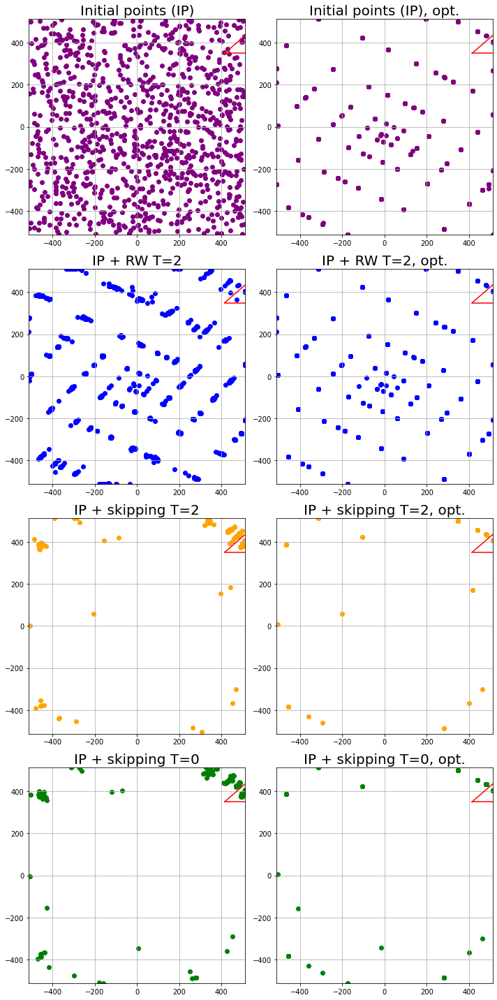

In [8]:
r = multistart_comparison(eggholder, n_samples = 1000, maxsteps = 100, temp = 1.0, sigma = 2.0, maxjumps = 200, maxlocalnonexits = 150, periodicboundary = True, boxsize = 512, optmethod = 'L-BFGS-B', seed = 3, plotflag = True)

# Illustration of a monotonic skipping trajectory with sublevel sets

The following code plots several snapshots of a monotonic skipping trajectory showing the sublevel set of the current point.

In [29]:
import numpy as np 
import math
from scipy.stats import gengamma
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy import optimize
import time
import pandas as pd
import matplotlib

def countourplot_threshold(function, lb, ub, onecolorflag, thresholdflag, threshold, fig_width, color, ls, lw, n_contours, resolution, pointflag, point, index=0):
    x = np.linspace(-lb, ub, resolution)
    y = np.linspace(-lb, ub, resolution)
    X, Y = np.meshgrid(x, y)
    Z =  np.array(list(map(lambda x: function(x), zip(X.flatten(), Y.flatten()))))
    Z = Z.reshape(X.shape)
    plt.figure(figsize=(fig_width,fig_width))
    plt.rc('xtick',labelsize=18)
    plt.rc('ytick',labelsize=18)
    if onecolorflag:
        if thresholdflag:
            d = np.ma.array(Z, mask=Z>threshold)
            plt.contour(X, Y, Z, n_contours, colors='gray', linestyles = ls, linewidths = lw)
            plt.contourf(X, Y, d, n_contours, colors=color)
        else:
            plt.contour(X, Y, Z, n_contours, cmap='RdGy', linestyles = ls, linewidths = lw)
    else:
        plt.set_cmap(cmap)
        plt.contourf(X, Y, Z, n_contours)
        plt.contour(X, Y, Z, n_contours, linestyles = ls, linewidths = lw)
    if pointflag:
        plt.scatter(point[0],point[1], s=175, c='black',marker='*')
    
    plt.gca().set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.savefig('trajectoryMSK_'+str(index)+'.eps', format='eps')
    
    return plt.show()

def smartskippingmove_tweaked(x, boxsize, function, sigma, maxjumps=50, periodicboundary=True):
    # skipping move function with threshold value and function evaluations counter
    global emptymoves
    global nfeval
    global emptymoves
    
    d = x.shape[0]
    threshold = function(x)
    nfeval += 1
    phi = np.random.normal(loc=0.0, scale=sigma, size=d)
    phi = phi/np.linalg.norm(phi)
    beta = math.sqrt(2 * sigma)
    r = gengamma.rvs(a = d/2., c = 2., loc = 0., scale = beta, size = maxjumps)
    xnew = x + phi*r[0]
    j = 1
    if periodicboundary:
        xnew = checkcoordinates(xnew, boxsize)
        monotonicityflag = monotonicityconstraintQ(xnew, function, threshold)
        nfeval += 1
        while (j < maxjumps and not(monotonicityflag)):
            xnew += phi*r[j]
            xnew = checkcoordinates(xnew, boxsize)
            j += 1
            monotonicityflag = monotonicityconstraintQ(xnew, function, threshold)

        if monotonicityflag:
            if j<maxjumps and j>1:
                print('True jump, j=',j)
            return True, xnew, j
        else:
            emptymoves += 1
            return False, x, j
    else:
        boundaryflag, monotonicityflag = bothconstraintsQindependent(xnew, boxsize, function, threshold)
        nfeval += 1
        while (j < maxjumps and boundaryflag and not(monotonicityflag)):
            xnew += phi*r[j]
            j += 1
            boundaryflag, monotonicityflag = bothconstraintsQindependent(xnew, boxsize, function, threshold)

        if boundaryflag and monotonicityflag:
            if j<maxjumps and j>1:
                print('True jump, j=',j)
            return True, xnew, j
        else:
            emptymoves += 1
            return False, x, j

def smartskippingtrajectory_display(x, boxsize, function, sigma, temp, maxsteps, maxjumps, maxlocalnonexits, periodicboundary=True, seed=1):
    # smart skipping trajectory with threshold value (and function evaluations counter)
    global nfeval
    
    snapshots = []
    nfeval = 0
    d = 2
    step = 0
    accepted = 0
    rejected = 0
    truesteps = 0
    localnonexits = 0
    trajectory = np.zeros([maxsteps+1,d])
    trajectory[step] = np.array(x)
    np.random.seed(seed)
    while step < maxsteps and localnonexits <= maxlocalnonexits:
        truesteps += 1
        exitflag, proposal, j = smartskippingmove_tweaked(trajectory[step], boxsize, function, sigma, maxjumps, periodicboundary)
        if exitflag:
            if np.random.uniform() <= densityratio(proposal, trajectory[step], function, temp):
                trajectory[step+1] = proposal
                localnonexits = 0
                if j>25:
                    print('Step',step)
                    snapshots.append(step)
                step += 1
                accepted += 1
            else:
                rejected +=1
        else:
            localnonexits += 1
    return trajectory[0:step+1], snapshots

We can generate a monotonic skipping trajectory, save it, and display it.

True jump, j= 7
True jump, j= 7
True jump, j= 9
True jump, j= 10
True jump, j= 19
True jump, j= 19
True jump, j= 9
True jump, j= 17
True jump, j= 15
True jump, j= 21
True jump, j= 12
True jump, j= 19
True jump, j= 22
True jump, j= 20
True jump, j= 30
Step 28
True jump, j= 36
Step 30
True jump, j= 30
Step 31
True jump, j= 38
Step 32
True jump, j= 12
True jump, j= 35
Step 34
True jump, j= 34
Step 35
True jump, j= 24
True jump, j= 57
Step 39
True jump, j= 9
True jump, j= 24
True jump, j= 39
Step 45
True jump, j= 39
Step 48
True jump, j= 63
Step 52
True jump, j= 27
Step 54
True jump, j= 70
Step 56
True jump, j= 61
Step 63
True jump, j= 75
Step 64
True jump, j= 49
Step 66
True jump, j= 54
Step 67
True jump, j= 80
Step 68
True jump, j= 15
True jump, j= 27
Step 72
True jump, j= 36
Step 73
True jump, j= 105
Step 79
True jump, j= 86
Step 83
True jump, j= 82
Step 84
True jump, j= 138
Step 87
True jump, j= 28
Step 88
True jump, j= 101
Step 107
True jump, j= 56
Step 129
True jump, j= 116
Step 133


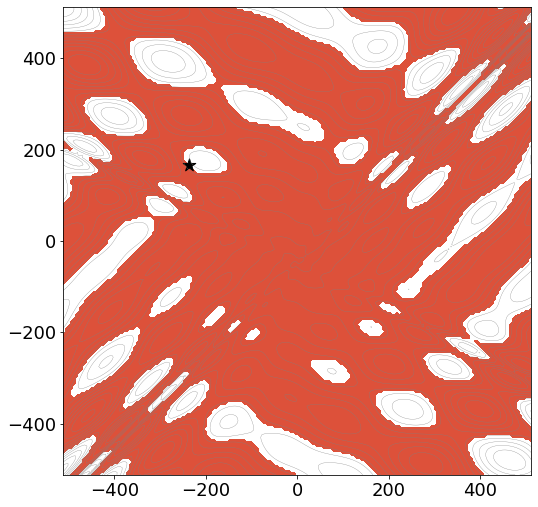

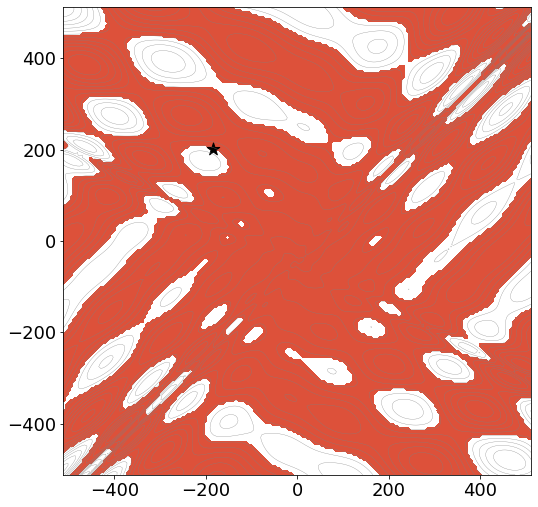

Step  39


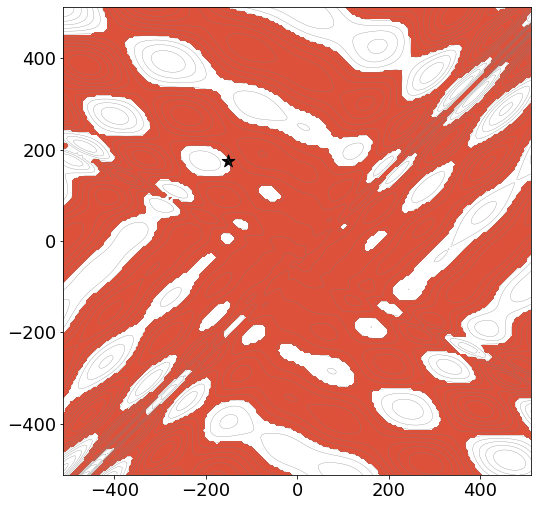

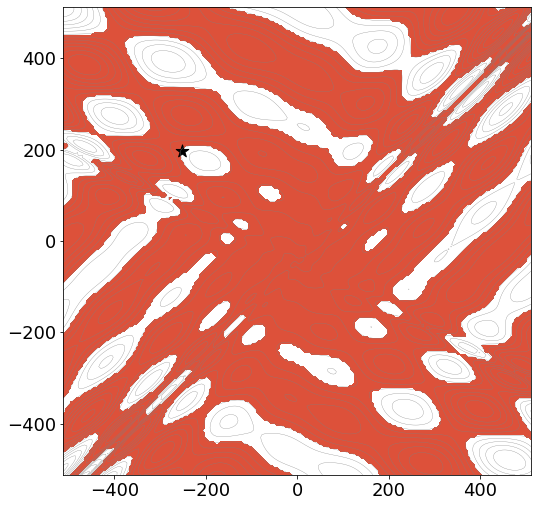

Step  45


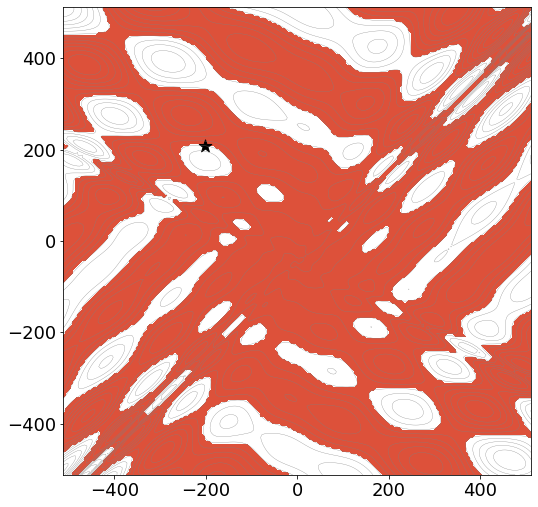

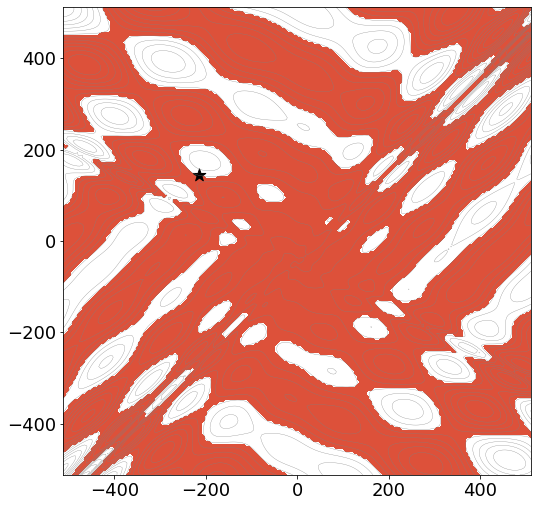

Step  48


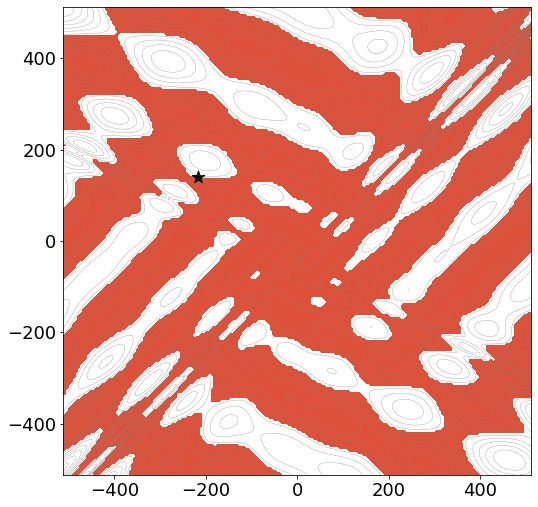

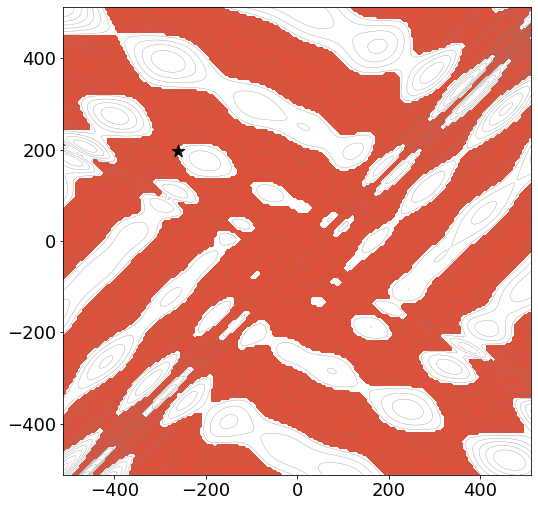

Step  52


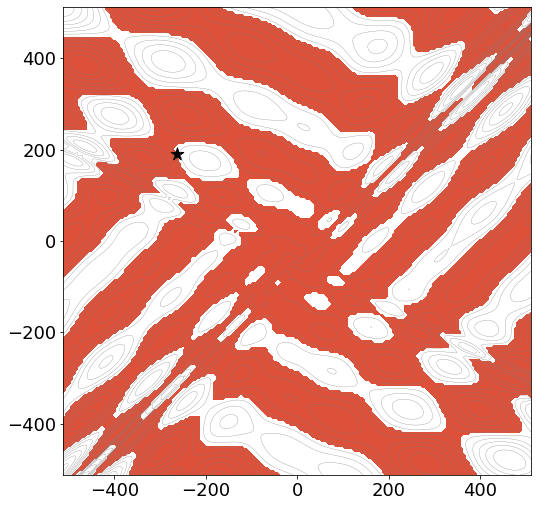

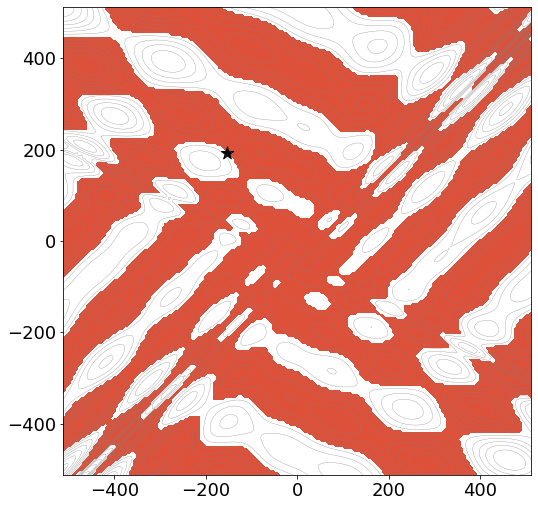

Step  54


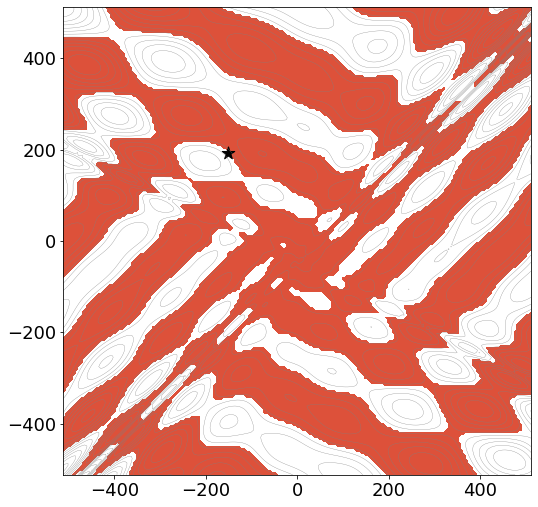

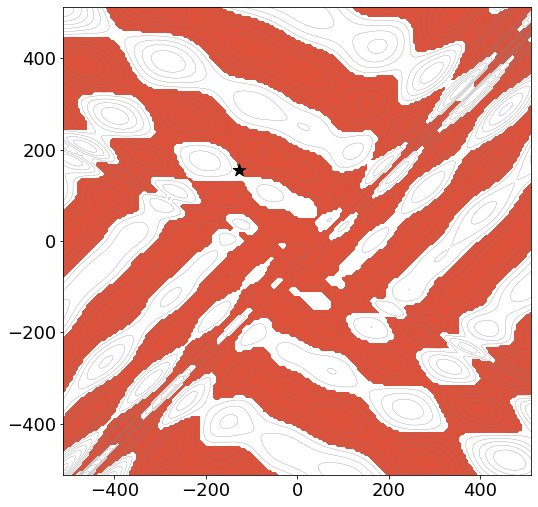

Step  56


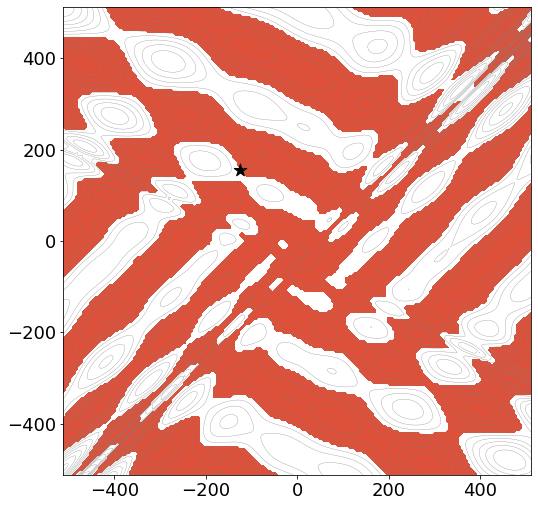

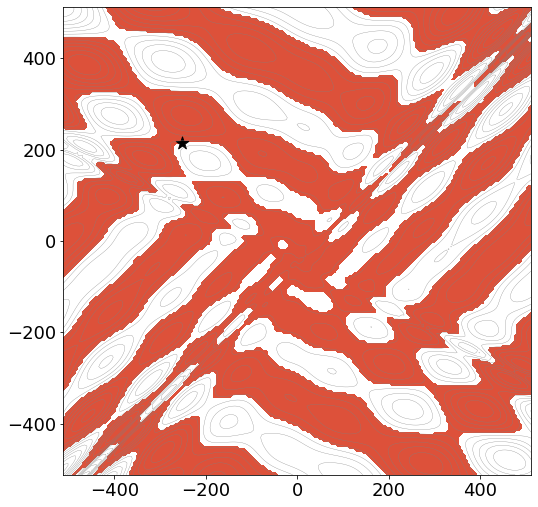

Step  63


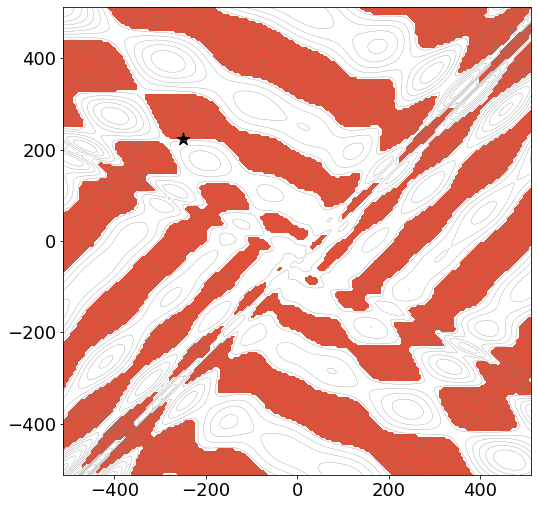

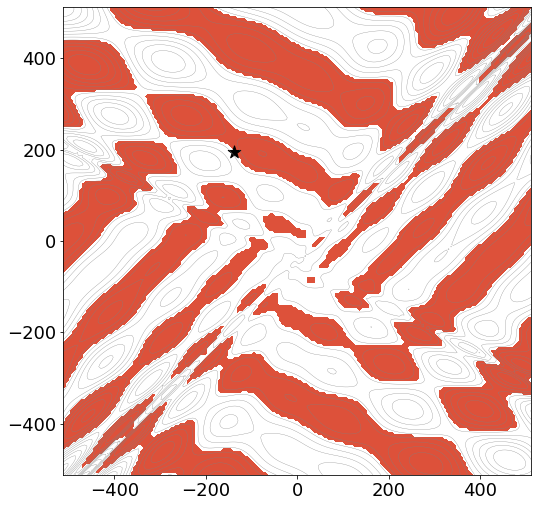

Step  64


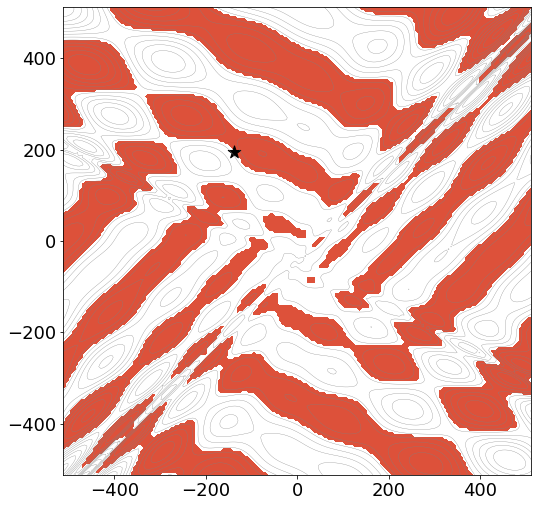

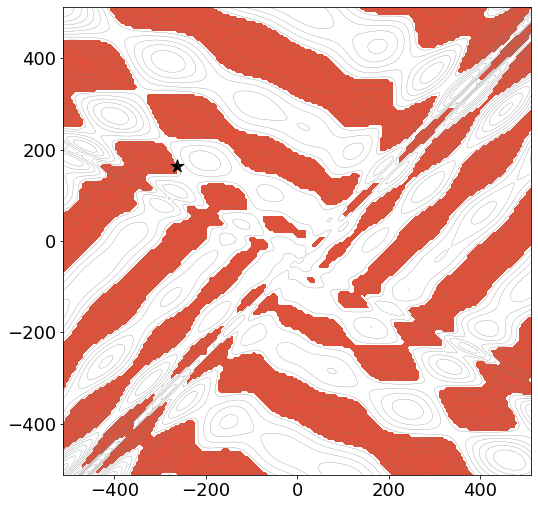

Step  66


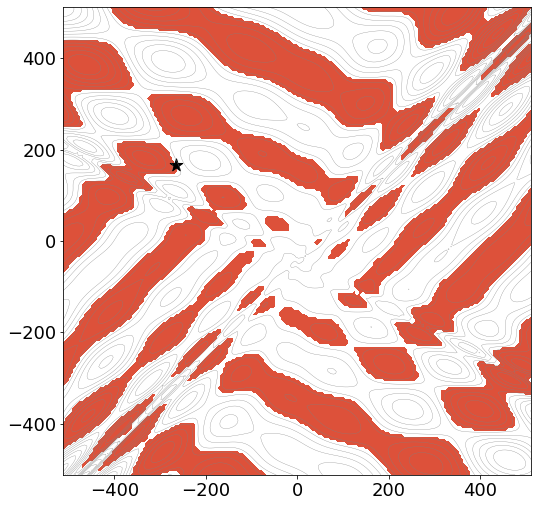

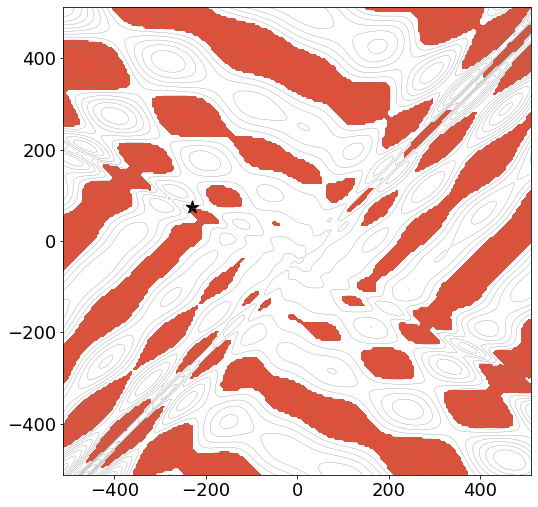

Step  67


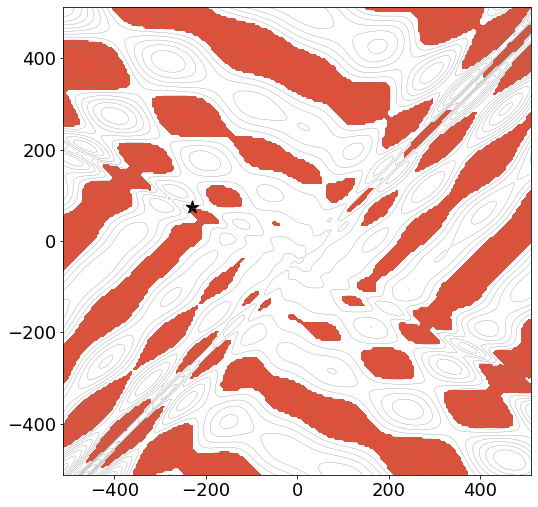

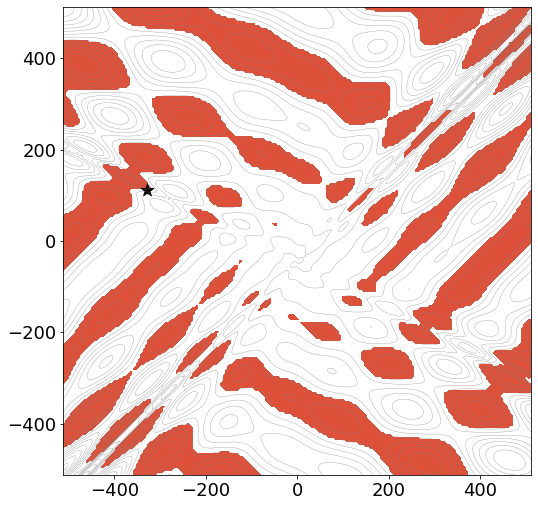

Step  68


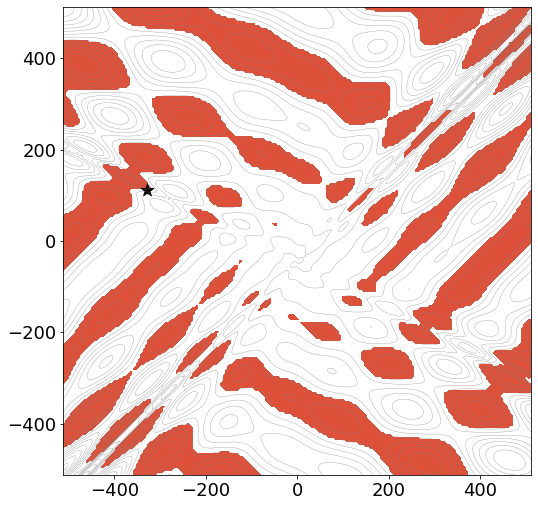

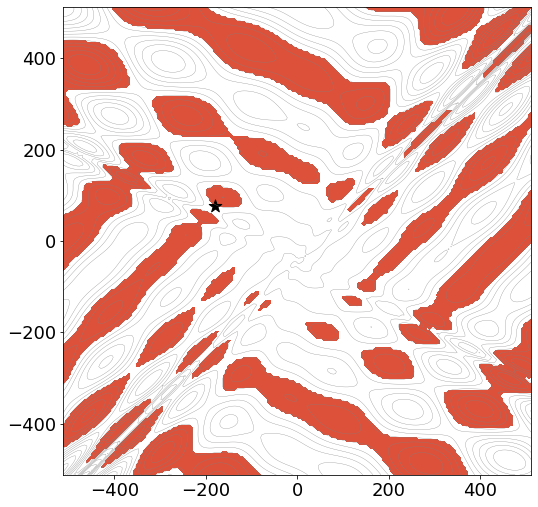

Step  72


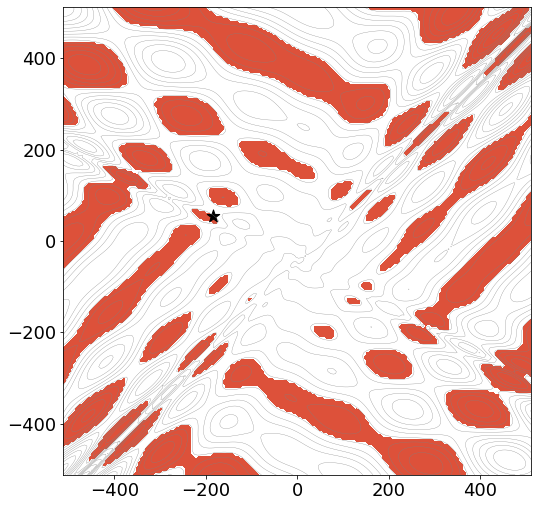

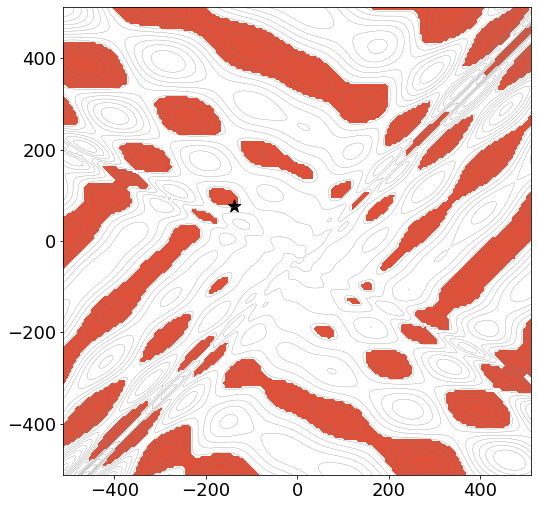

Step  73


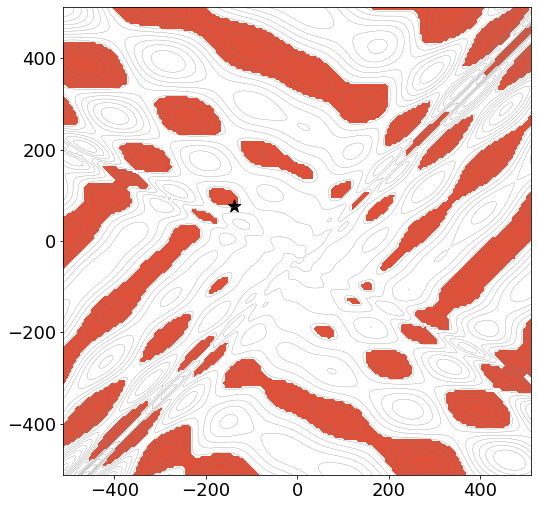

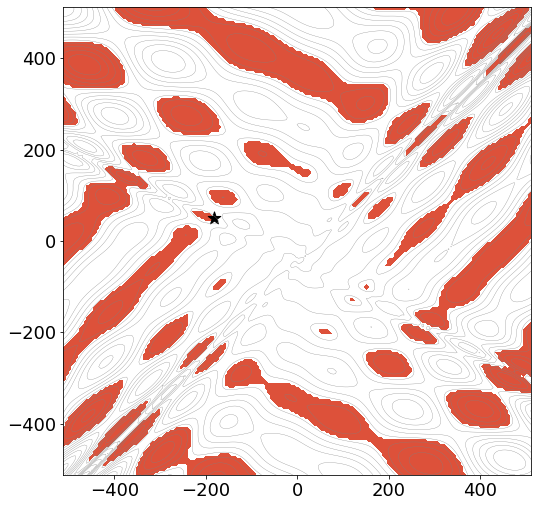

Step  79


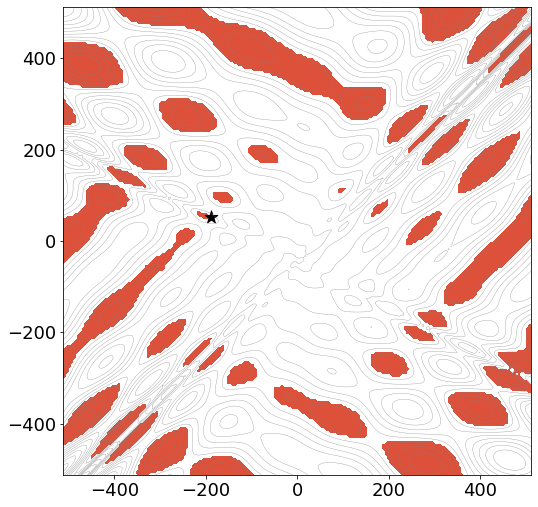

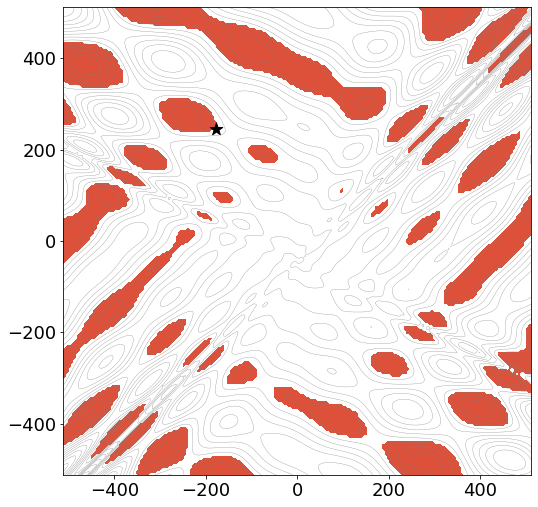

Step  83


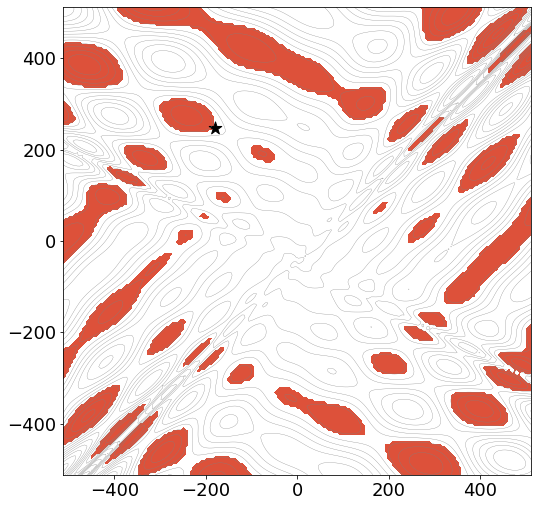

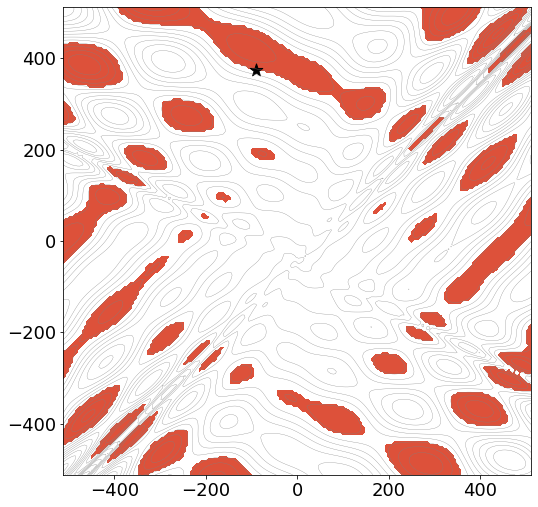

Step  84


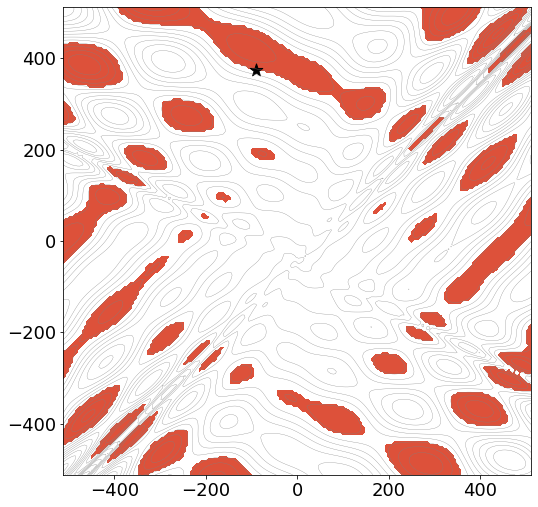

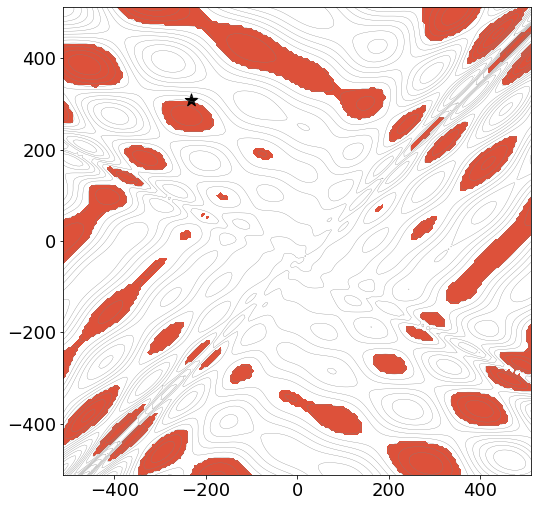

Step  87


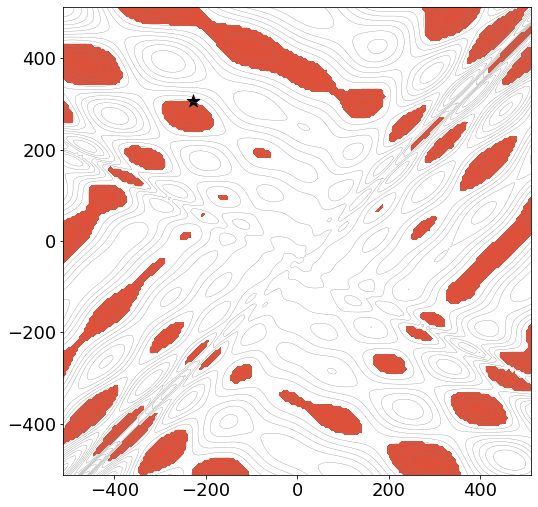

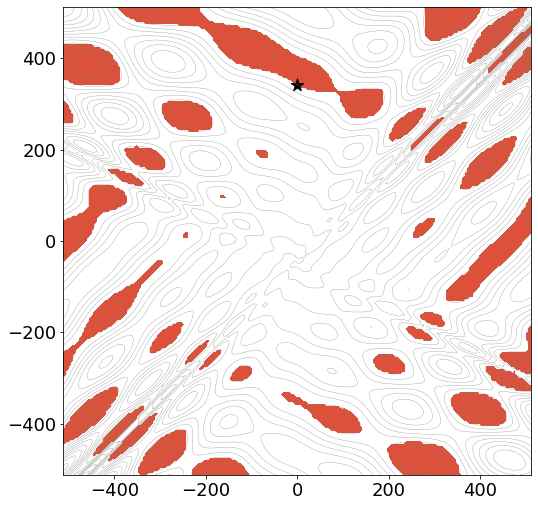

Step  88


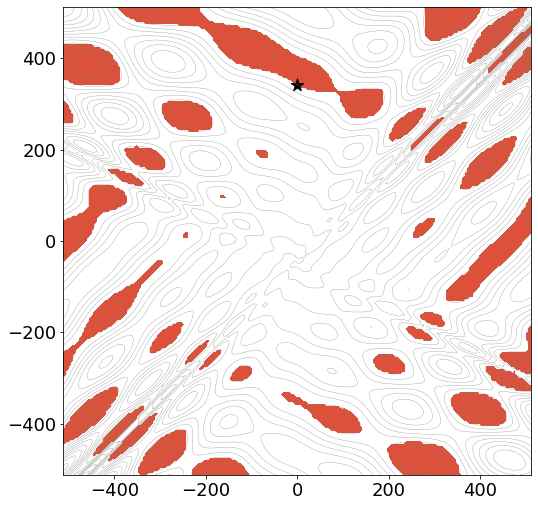

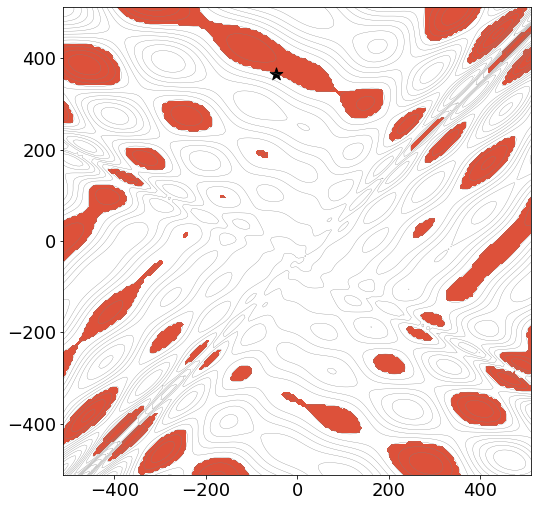

Step  107


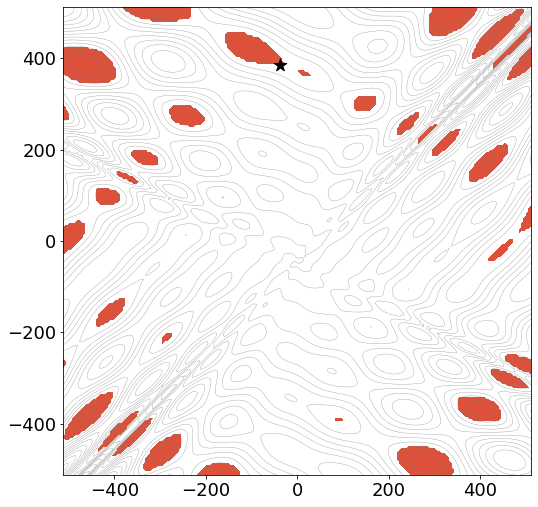

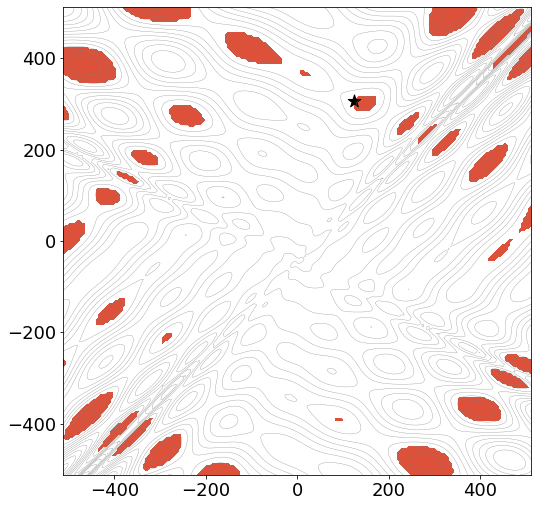

Step  129


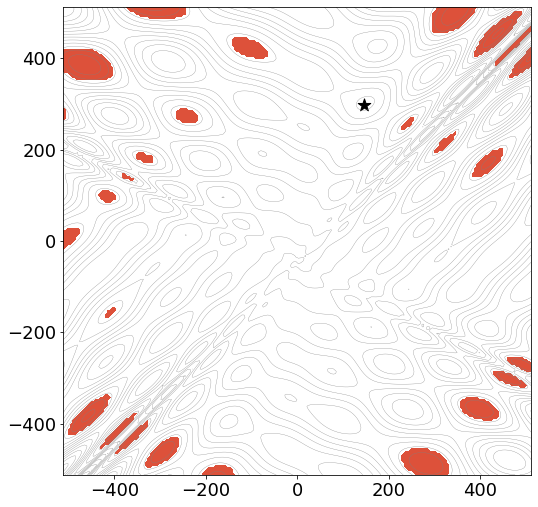

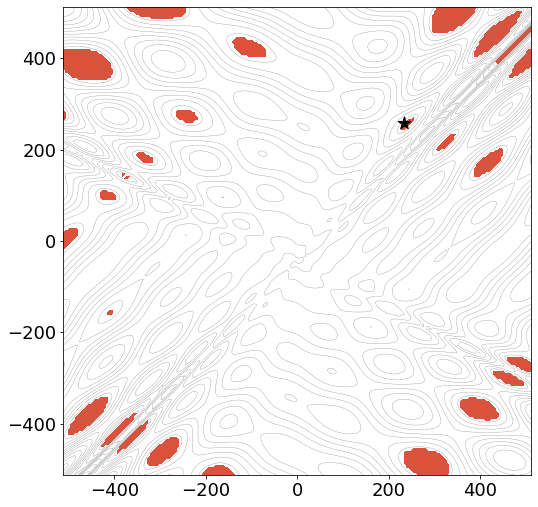

Step  133


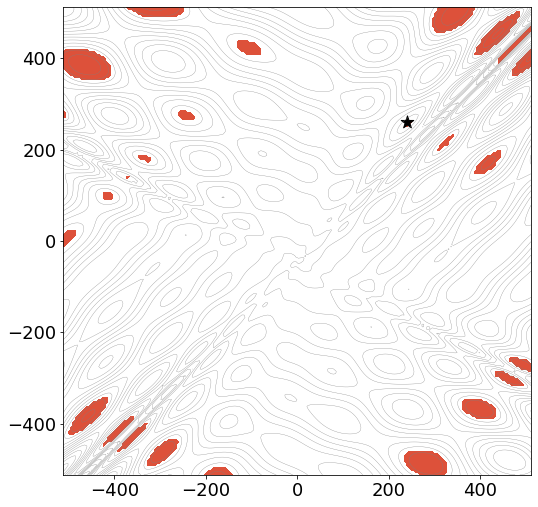

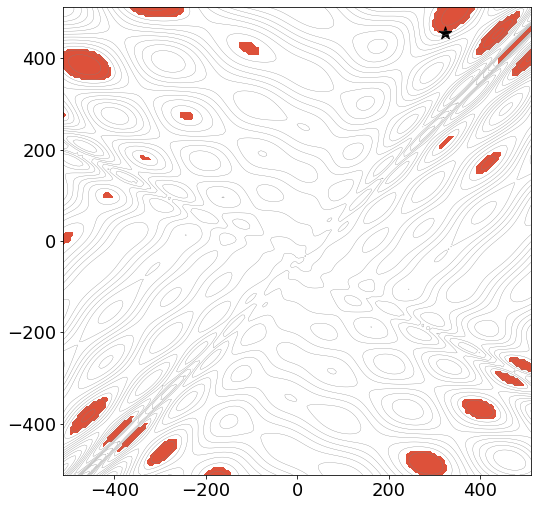

Step  134


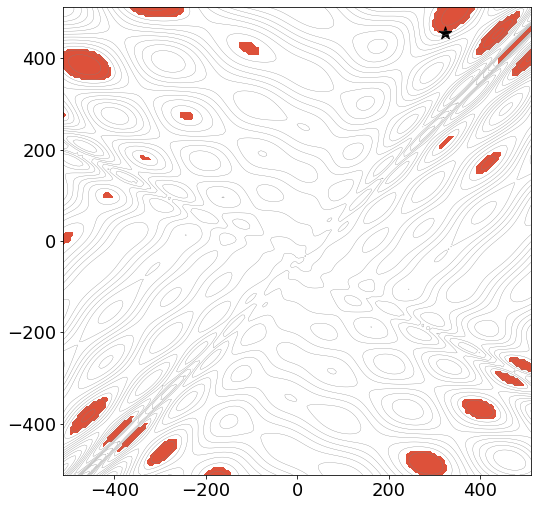

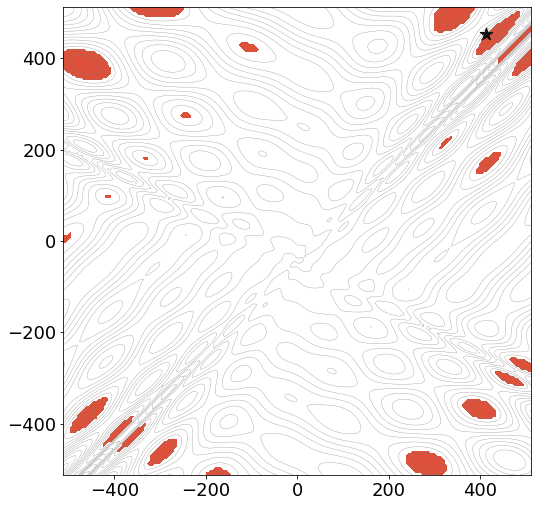

Step  135


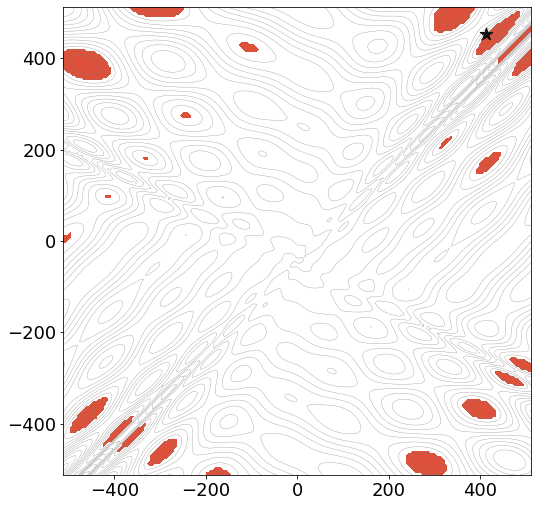

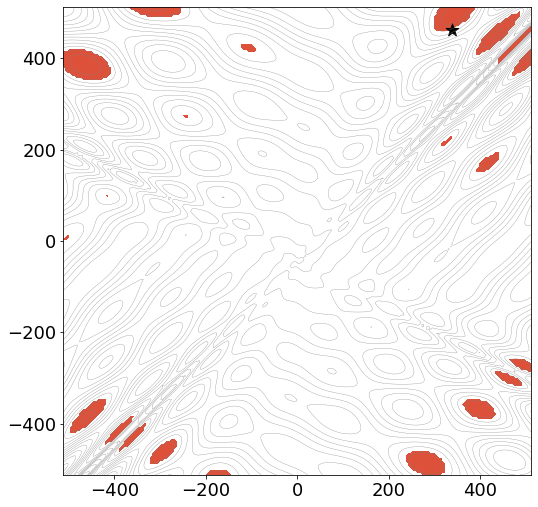

Step  136


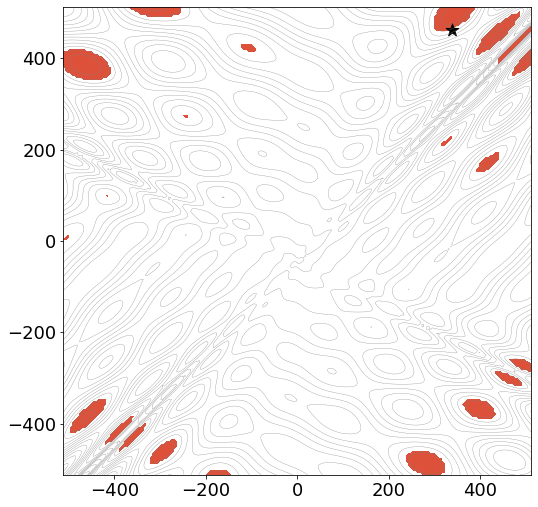

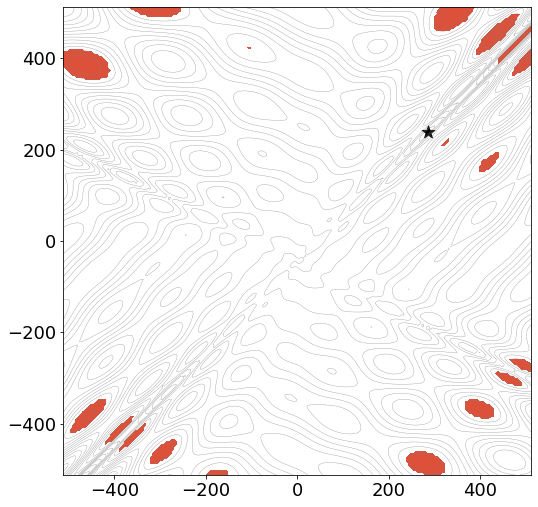

Step  137


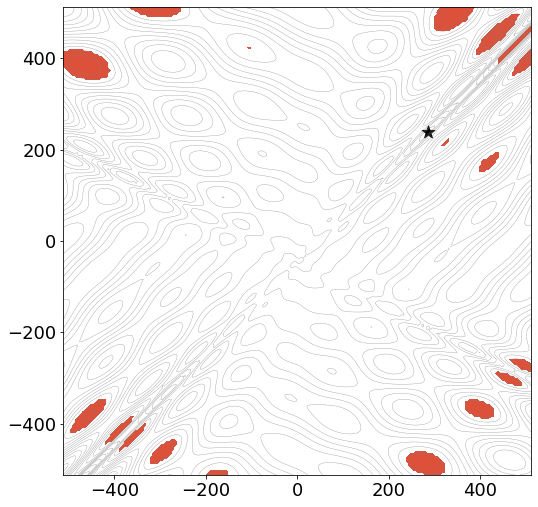

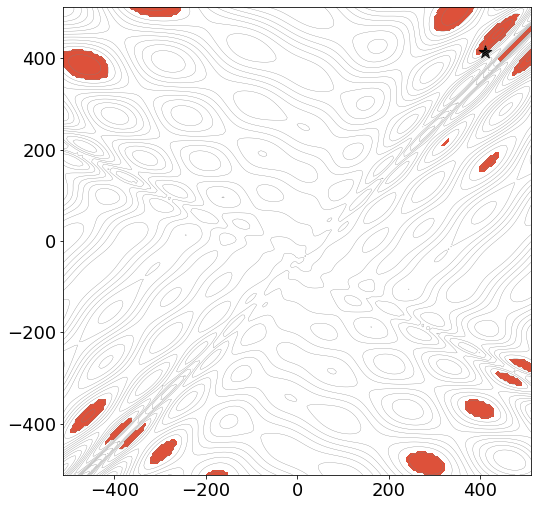

Step  139


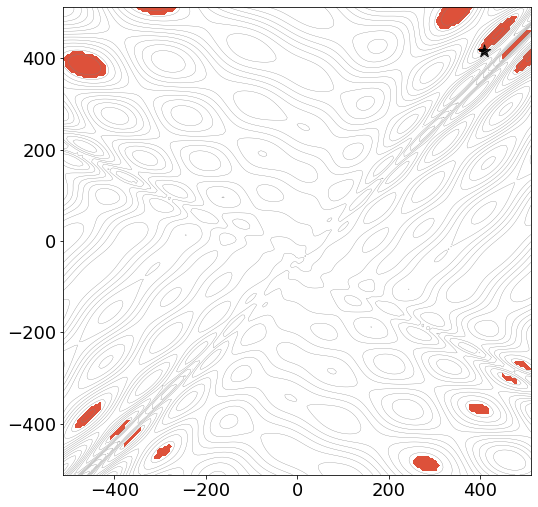

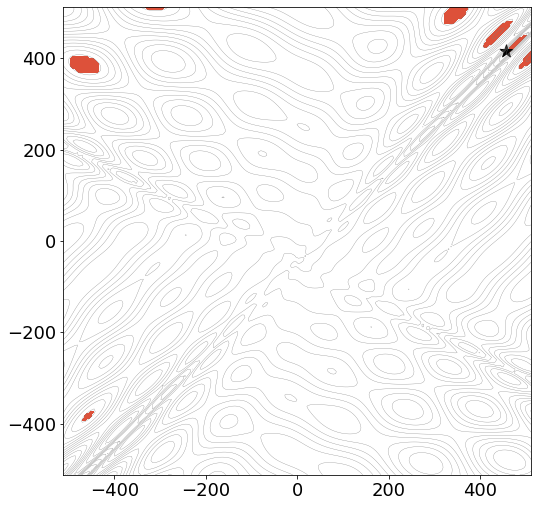

Step  145


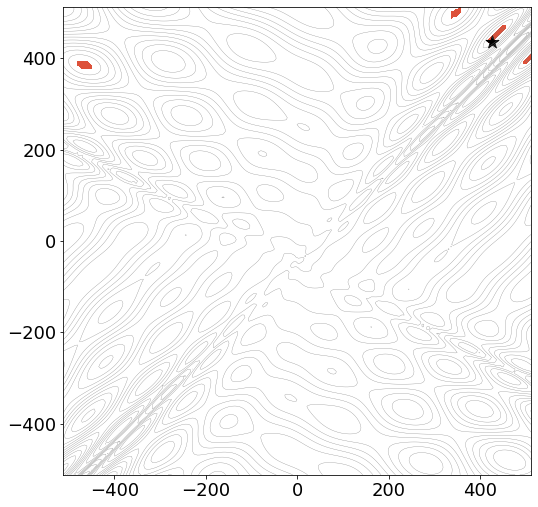

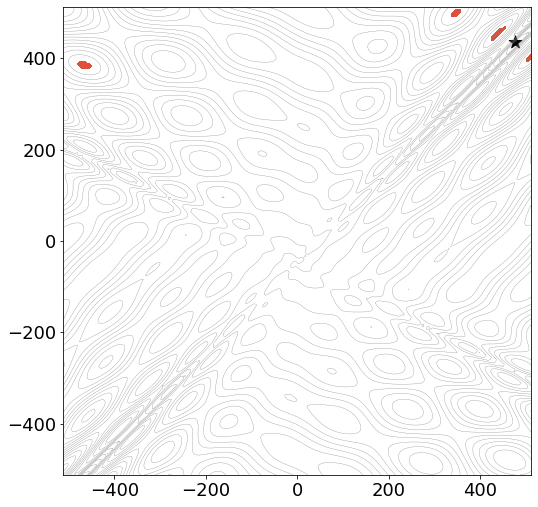

In [37]:
matplotlib.colors.to_hex(cmap(0.6))
cmap = plt.get_cmap('inferno')

emptymoves = 0
boxsize = 512

trajectory, snapshots = smartskippingtrajectory_display(np.array([-200,180]), boxsize=512, function=eggholder, sigma=2.0, temp=0.0, maxsteps=150, maxjumps=150, maxlocalnonexits=100, periodicboundary=False, seed=3)
trajectory
for i in range(5,len(snapshots)):
    print('Step ',snapshots[i])
    countourplot_threshold(eggholder, boxsize, boxsize, True, True, eggholder(trajectory[snapshots[i]]), 7.5, matplotlib.colors.to_hex(cmap(0.6)), 'solid', 0.3, 17, 200, True, trajectory[snapshots[i]],snapshots[i])
    countourplot_threshold(eggholder, boxsize, boxsize, True, True, eggholder(trajectory[snapshots[i]+1]), 7.5, matplotlib.colors.to_hex(cmap(0.6)), 'solid', 0.3, 17, 200, True, trajectory[snapshots[i]+1],snapshots[i]+1)

A specific trajectory has been saved and displayed in Figure 5 of the paper

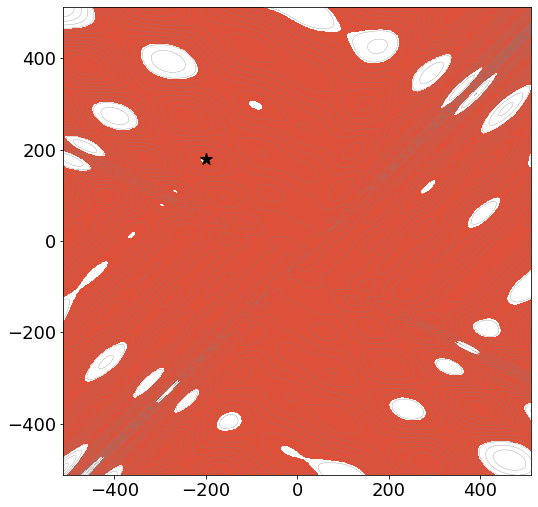

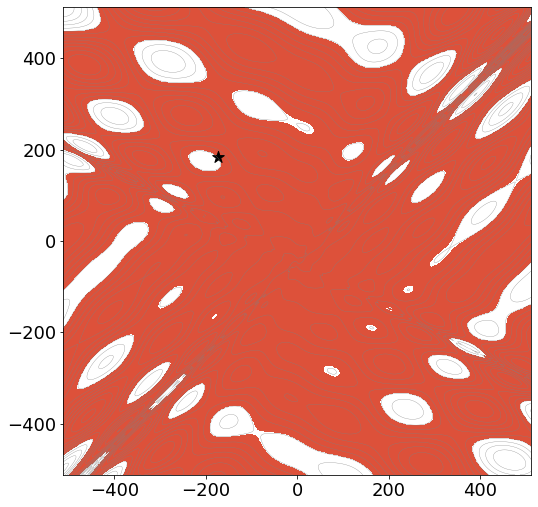

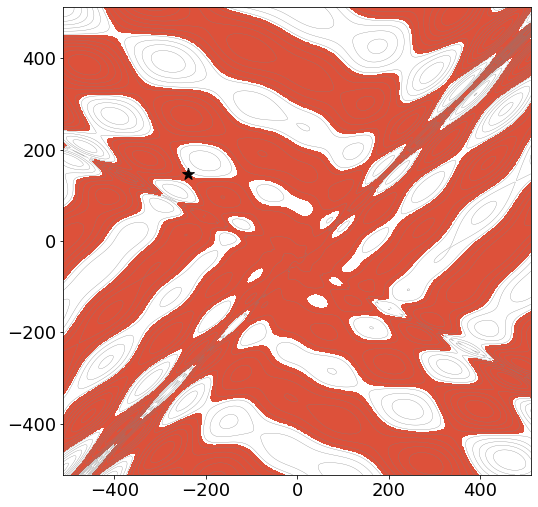

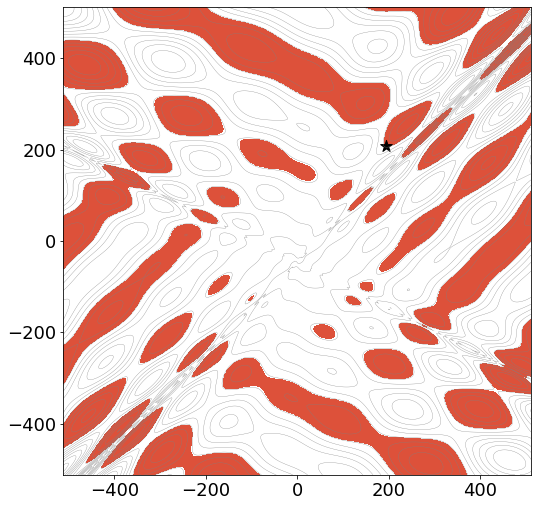

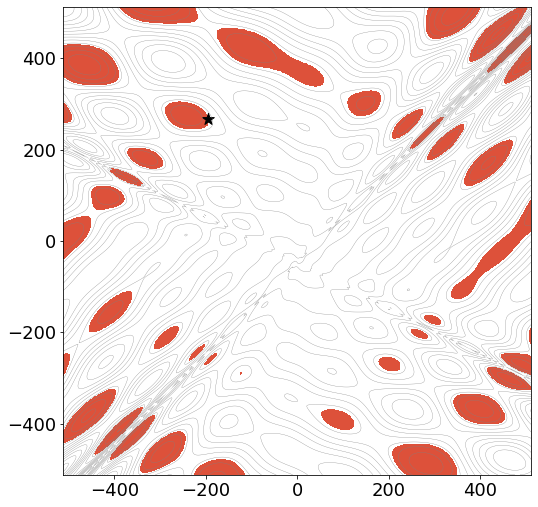

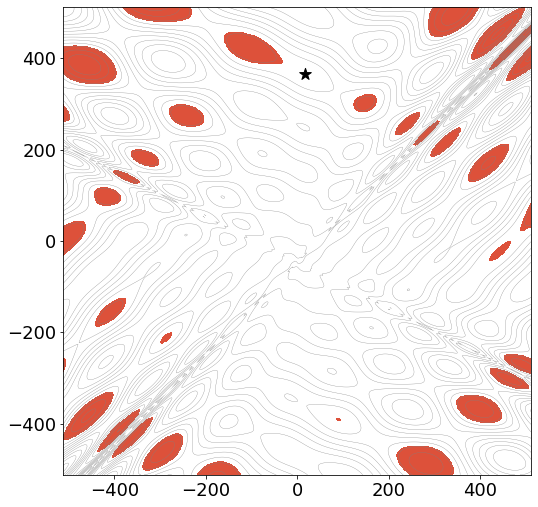

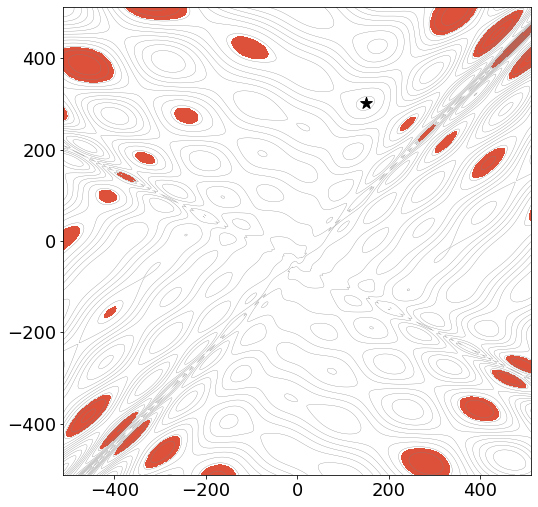

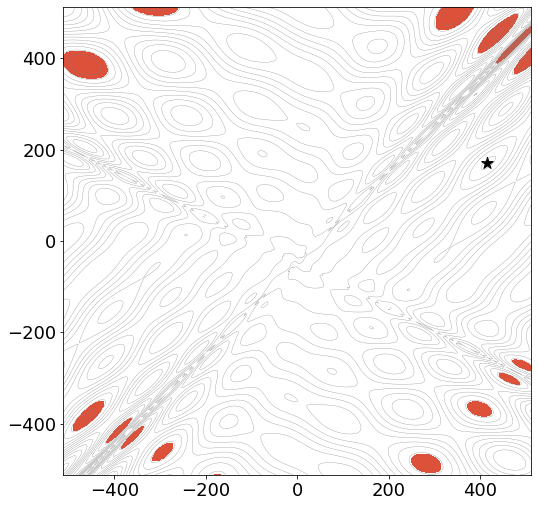

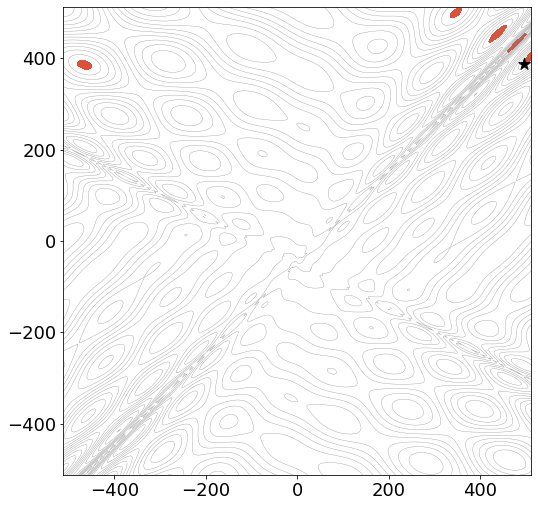

In [228]:
matplotlib.colors.to_hex(cmap(0.6))
cmap = plt.get_cmap('inferno')

trajectory2 = array([[-200.00, 180.00],[-173.50, 184.34], [-238.93, 147.29], [194.13, 207.50], [-194.29, 268.04], [18.03, 365.92],[150.08, 301.67],[414.96, 170.69], [496.53, 388.24]])

for i in range(len(trajectory2)):
    countourplot_threshold(eggholder, boxsize, boxsize, True, True, eggholder(trajectory2[i]), 7.5, matplotlib.colors.to_hex(cmap(0.6)), 'solid', 0.3, 17, 800, True, trajectory2[i],i)